<a href="https://colab.research.google.com/github/rinlopable/PCD_Assignment01/blob/main/PCD_Assignment01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PCD Assignment 01
## Downsampling & Upsampling

**Name:** NI Wayan Regina Raytana Putri

**NIM:** 25/558695/PA/23481

## 1. Introduction

this experiment analyzes the effects of different downsampling & upsampling methods on digital images with different characteristics

the downsampling methods used are:
- max pooling
- average pooling
- median pooling

the upsampling methods used are:
- nearest neighbor
- bilinear interpolation
- bicubic interpolation

3 images with different characteristics are used to observe how each method affects edges, natural scenes, and fine details

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

repo_path = "/content/PCD_Assignment01"
if not os.path.exists(repo_path):
  !git clone https://github.com/rinlopable/PCD_Assignment01.git
else:
  print("repo already loaded")

Cloning into 'PCD_Assignment01'...
remote: Enumerating objects: 28, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 28 (delta 6), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (28/28), 8.31 MiB | 22.11 MiB/s, done.
Resolving deltas: 100% (6/6), done.


## 2. load input images

In [2]:
edges_img = cv2.imread(
    "/content/PCD_Assignment01/images/image_edges.jpg"
)

natural_img = cv2.imread(
    "/content/PCD_Assignment01/images/image_natural.jpg"
)

detail_img = cv2.imread(
    "/content/PCD_Assignment01/images/image_detail.jpg"
)

assert edges_img is not None, "image_edges.jpg not found"
assert natural_img is not None, "image_natural.jpg not found"
assert detail_img is not None, "image_detail.jpg not found"

edges_img = cv2.cvtColor(edges_img, cv2.COLOR_BGR2RGB)
natural_img = cv2.cvtColor(natural_img, cv2.COLOR_BGR2RGB)
detail_img = cv2.cvtColor(detail_img, cv2.COLOR_BGR2RGB)

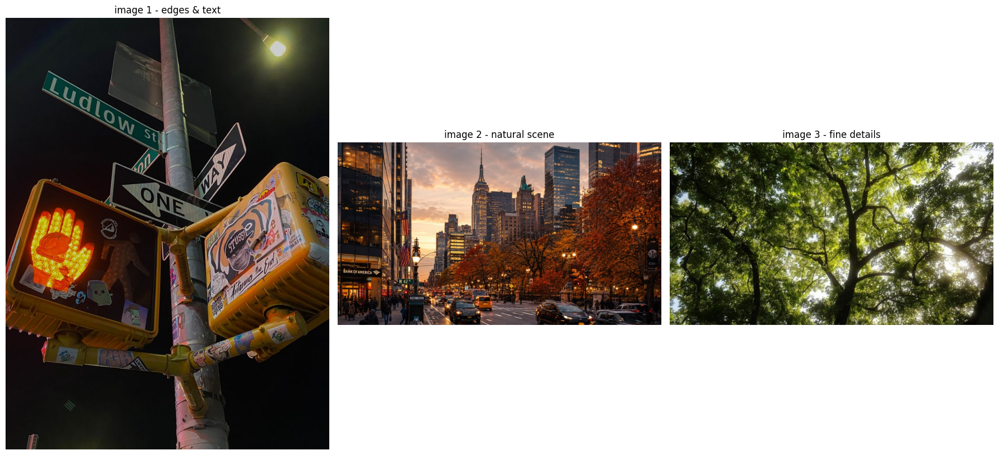

In [3]:
plt.figure(figsize=(18,16))

plt.subplot(1, 3, 1)
plt.imshow(edges_img)
plt.title("image 1 - edges & text")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(natural_img)
plt.title("image 2 - natural scene")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(detail_img)
plt.title("image 3 - fine details")
plt.axis("off")

plt.tight_layout()
plt.show()

## 3. downsampling

downsampling reduces the spatial resolution of an image by combining several neighboring pixels into 1 output pixel

in this experiment, downsampling is first tested using a factor of 2. a factor of 4 is then used to make the differences between the methods easier to observe

- **max pooling:** selects the maximum pixel value in each block
- **average pooling:** calculates the average pixel value in each block
- **median pooling:** selects the median pixel value in each block

In [4]:
def downsample_pooling(image, factor=2, method="average"):
  height, width, channels = image.shape

  # crop the image so its dimensions are divisible by the factor
  new_height = height - (height % factor)
  new_width = width - (width % factor)

  image = image[:new_height, :new_width]

  # divide the image into small blocks
  blocks = image.reshape(
      new_height // factor, factor,
      new_width // factor, factor,
      channels
  )

  if method == "max":
    result = np.max(blocks, axis=(1,3))

  elif method == "average":
    result = np.mean(blocks, axis=(1,3))

  elif method == "median":
    result = np.median(blocks, axis=(1,3))

  else:
    raise ValueError("Unknown downsampling method")

  return result.astype(np.uint8)

In [5]:
edges_max = downsample_pooling(edges_img, factor=2, method="max")
edges_average = downsample_pooling(edges_img, factor=2, method="average")
edges_median = downsample_pooling(edges_img, factor=2, method="median")

print("original:", edges_img.shape)
print("max:", edges_max.shape)
print("average:", edges_average.shape)
print("median:", edges_median.shape)

original: (981, 736, 3)
max: (490, 368, 3)
average: (490, 368, 3)
median: (490, 368, 3)


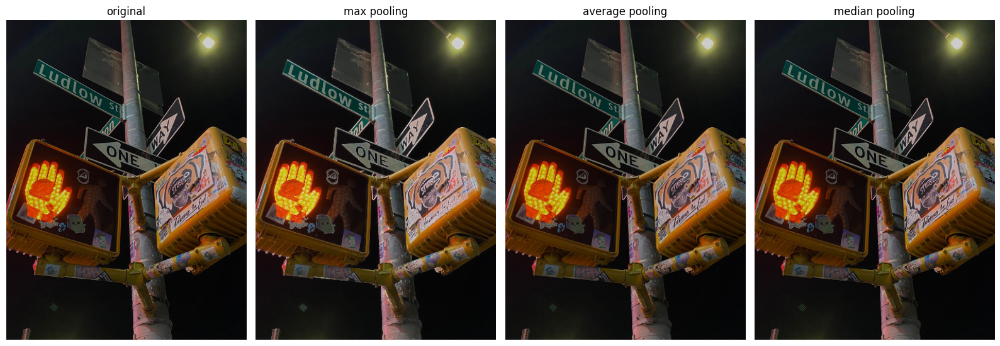

In [6]:
plt.figure(figsize=(16,6))

plt.subplot(1, 4, 1)
plt.imshow(edges_img)
plt.title("original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(edges_max)
plt.title("max pooling")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(edges_average)
plt.title("average pooling")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(edges_median)
plt.title("median pooling")
plt.axis("off")

plt.tight_layout()
plt.show()

### 3.1 experiment with downsampling factor 4


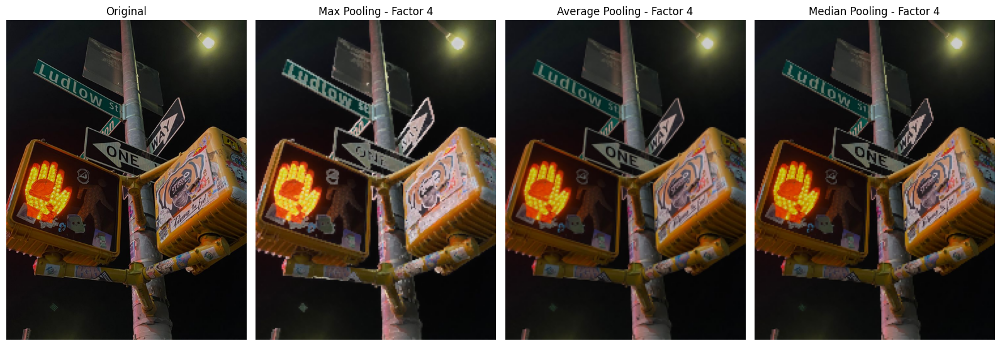

In [7]:
edges_max_4 = downsample_pooling(edges_img, factor=4, method="max")
edges_average_4 = downsample_pooling(edges_img, factor=4, method="average")
edges_median_4 = downsample_pooling(edges_img, factor=4, method="median")

plt.figure(figsize=(16, 6))

plt.subplot(1, 4, 1)
plt.imshow(edges_img)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(edges_max_4)
plt.title("Max Pooling - Factor 4")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(edges_average_4)
plt.title("Average Pooling - Factor 4")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(edges_median_4)
plt.title("Median Pooling - Factor 4")
plt.axis("off")

plt.tight_layout()
plt.show()

### 3.2 downsampling comparison on different images

the 3 downsampling methods are applied to images with different characteristics using a downsampling factor of 4. this makes the effect of each method easier to observe

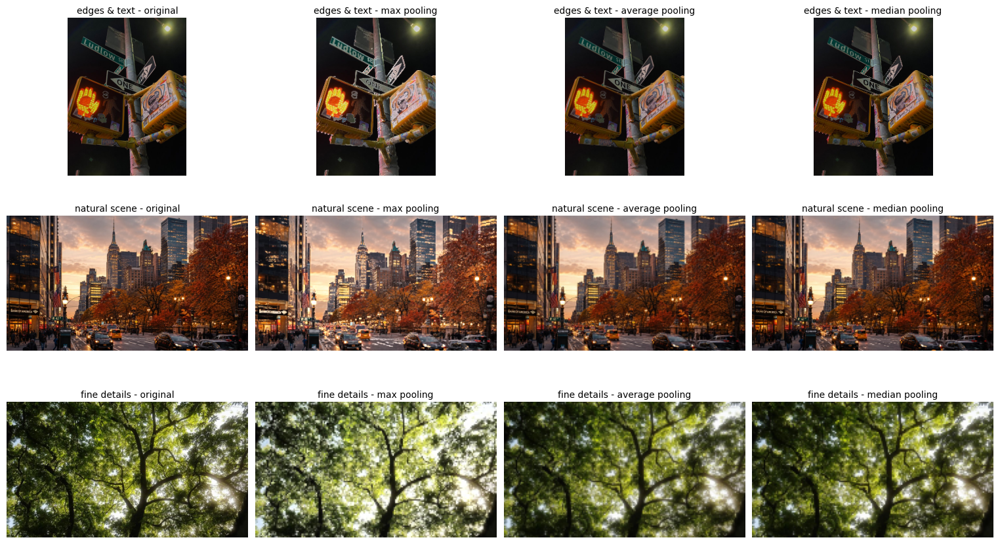

In [8]:
factor = 4

# edges & text image
edges_max = downsample_pooling(edges_img, factor=factor, method="max")
edges_average = downsample_pooling(edges_img, factor=factor, method="average")
edges_median = downsample_pooling(edges_img, factor=factor, method="median")

# natural scene image
natural_max = downsample_pooling(natural_img, factor=factor, method="max")
natural_average = downsample_pooling(natural_img, factor=factor, method="average")
natural_median = downsample_pooling(natural_img, factor=factor, method="median")

# fine detail image
detail_max = downsample_pooling(detail_img, factor=factor, method="max")
detail_average = downsample_pooling(detail_img, factor=factor, method="average")
detail_median = downsample_pooling(detail_img, factor=factor, method="median")

fig, axes = plt.subplots(3, 4, figsize=(16,9))

comparison_images = [
    [edges_img, edges_max, edges_average, edges_median],
    [natural_img, natural_max, natural_average, natural_median],
    [detail_img, detail_max, detail_average, detail_median]
]

column_titles = [
    "original",
    "max pooling",
    "average pooling",
    "median pooling"
]

row_labels = [
    "edges & text",
    "natural scene",
    "fine details"
]

for row in range(3):
  for col in range(4):
    axes[row, col].imshow(comparison_images[row][col])
    axes[row, col].axis("off")

    axes[row, col].set_title(
        f"{row_labels[row]} - {column_titles[col]}",
        fontsize=10,
        pad=5
    )

plt.subplots_adjust(
    left=0.03,
    right=0.97,
    top=0.95,
    bottom=0.05,
    wspace=0.03,
    hspace=0.18
   )
plt.show()

## 4. upsampling

upsampling increases the spatial resolution of an image by creating additional pixels

in this experiment, the images previously downsampled using average pooling with a factor of 4 are enlarged again using 3 interpolation methods:
- **nearest neighbor:** assigns the value of the nearest existing pixel
- **bilinear interpolation:** estimates new pixel values using 4 neighboring pixels
- **bicubic interpolation:** estimates new pixel values using a larger neighborhood of 16 pixels

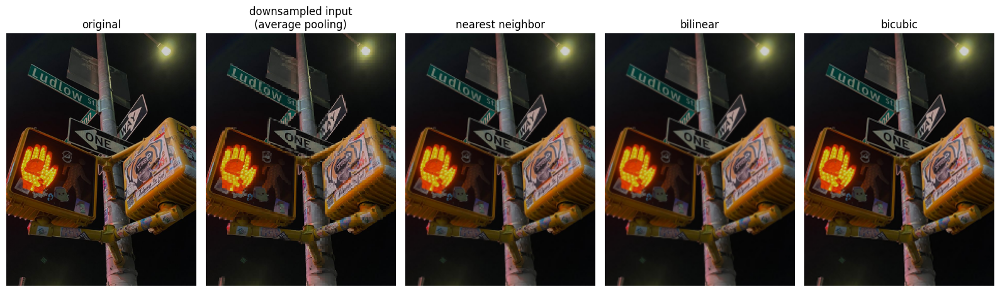

original: (980, 736, 3)
downsampled: (245, 184, 3)
nearest neighbor: (980, 736, 3)
bilinear: (980, 736, 3)
bicubic: (980, 736, 3)


In [9]:
# crop the ori image so it matches the dimensions used during downsampling
edges_reference = edges_img[
    :edges_average.shape[0]*factor,
    :edges_average.shape[1]*factor
]

target_height, target_width = edges_reference.shape[:2]

# nearest neighbor
edges_nn = cv2.resize(
    edges_average,
    (target_width, target_height),
    interpolation = cv2.INTER_NEAREST
)

# bilinear
edges_bilinear = cv2.resize(
    edges_average,
    (target_width, target_height),
    interpolation = cv2.INTER_LINEAR
)

# bicubic
edges_bicubic = cv2.resize(
    edges_average,
    (target_width, target_height),
    interpolation = cv2.INTER_CUBIC
)

plt.figure(figsize=(16, 6))

plt.subplot(1, 5, 1)
plt.imshow(edges_reference)
plt.title("original")
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(edges_average, interpolation="nearest")
plt.title("downsampled input\n(average pooling)")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(edges_nn)
plt.title("nearest neighbor")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(edges_bilinear)
plt.title("bilinear")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(edges_bicubic)
plt.title("bicubic")
plt.axis("off")

plt.tight_layout()
plt.show()

print("original:", edges_reference.shape)
print("downsampled:", edges_average.shape)
print("nearest neighbor:", edges_nn.shape)
print("bilinear:", edges_bilinear.shape)
print("bicubic:", edges_bicubic.shape)

### "zoom & cropped" version

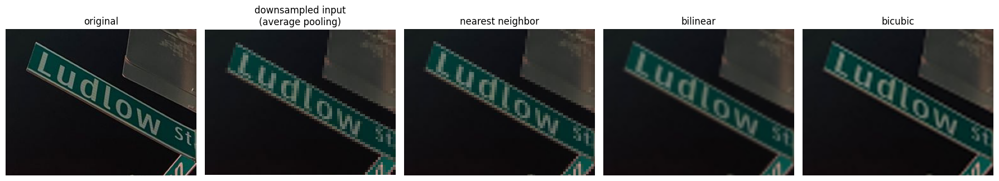

In [10]:
# crop a region w text & strong edges
y1, y2 = 100, 330
x1, x2 = 50, 350

original_cropped = edges_reference[y1:y2, x1:x2]
nn_cropped = edges_nn[y1:y2, x1:x2]
bilinear_cropped = edges_bilinear[y1:y2, x1:x2]
bicubic_cropped = edges_bicubic[y1:y2, x1:x2]

# downsampled ver
downsampled_cropped = edges_average[
    y1 // factor : y2 // factor,
    x1 // factor : x2 // factor
]

plt.figure(figsize=(18, 5))

plt.subplot(1, 5, 1)
plt.imshow(original_cropped)
plt.title("original")
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(downsampled_cropped, interpolation="nearest")
plt.title("downsampled input\n(average pooling)")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(nn_cropped)
plt.title("nearest neighbor")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(bilinear_cropped)
plt.title("bilinear")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(bicubic_cropped)
plt.title("bicubic")
plt.axis("off")

plt.tight_layout()
plt.show()


### 4.1 upsampling comparison on different images

to compare the effect of different upsampling methods, the images that were previously downsampled using average pooling with a factor of 4 are used as the low-resolution input

each downsampled image is enlarged back to approx its original size using:
- **nearest neighbor**
- **bilinear interpolation**
- **bicubic interpolation**

the original image is also displayed as a reference to observe how much visual info is recovered after upsampling


In [11]:
def upsample_image(original, downsampled, factor=4):
  # crop the ori image so it matches the area that was used during downsampling
  reference = original[
      :downsampled.shape[0]*factor,
      :downsampled.shape[1]*factor
  ]

  target_height, target_width = reference.shape[:2]

  # nearest neighbor
  nearest = cv2.resize(
      downsampled,
      (target_width, target_height),
      interpolation = cv2.INTER_NEAREST
  )

  # bilinear interpolation
  bilinear = cv2.resize(
      downsampled,
      (target_width, target_height),
      interpolation = cv2.INTER_LINEAR
  )

  # bicubic interpolation
  bicubic = cv2.resize(
      downsampled,
      (target_width, target_height),
      interpolation = cv2.INTER_CUBIC
  )

  return reference, nearest, bilinear, bicubic

In [12]:
# edges & text image
edges_reference, edges_nn, edges_bilinear, edges_bicubic = upsample_image(
    edges_img,
    edges_average,
    factor
)

# natural scene iamge
natural_reference, natural_nn, natural_bilinear, natural_bicubic = upsample_image(
    natural_img,
    natural_average,
    factor
)

# fine detail image
detail_reference, detail_nn, detail_bilinear, detail_bicubic = upsample_image(
    detail_img,
    detail_average,
    factor
)

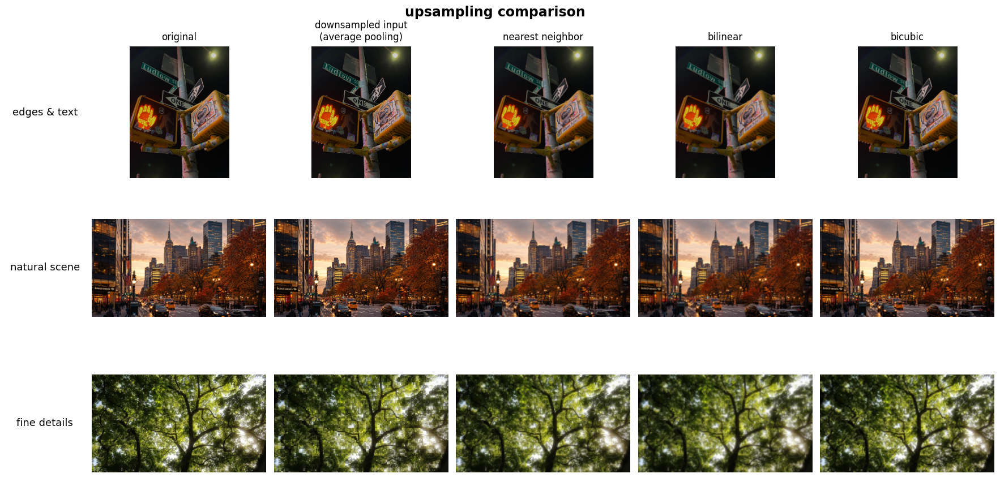

In [13]:
upsampling_sets = [
    (
        "edges & text",
        edges_reference,
        edges_average,
        edges_nn,
        edges_bilinear,
        edges_bicubic
    ),
    (
        "natural scene",
        natural_reference,
        natural_average,
        natural_nn,
        natural_bilinear,
        natural_bicubic
    ),
    (
        "fine details",
        detail_reference,
        detail_average,
        detail_nn,
        detail_bilinear,
        detail_bicubic
    )
]

titles = [
    "original",
    "downsampled input\n(average pooling)",
    "nearest neighbor",
    "bilinear",
    "bicubic"
]

row_names = [
    "edges & text",
    "natural scene",
    "fine details"
]

fig = plt.figure(figsize=(18, 9))

gs = fig.add_gridspec(
    3, 6,
    width_ratios=[0.45, 1, 1, 1, 1, 1],
    wspace=0.05,
    hspace=0.18
)

for row, (name, original, downsampled, nearest, bilinear, bicubic) in enumerate(upsampling_sets):

  images = [
      original,
      downsampled,
      nearest,
      bilinear,
      bicubic
  ]

  # left label column
  label_ax = fig.add_subplot(gs[row, 0])
  label_ax.axis("off")

  label_ax.text(
      0.5,
      0.5,
      row_names[row],
      fontsize=13,
      ha="center",
      va="center"
  )

  #image columns
  for col in range(5):

    ax = fig.add_subplot(gs[row, col+1])

    if col == 1:
      ax.imshow(
          images[col],
          interpolation="nearest"
      )

    else:
      ax.imshow(images[col])

    ax.axis("off")

    if row == 0:
      ax.set_title(
          titles[col],
          fontsize=12,
          pad=8
    )

fig.suptitle(
    "upsampling comparison",
    fontsize=17,
    fontweight="bold",
    y=0.98
)

plt.subplots_adjust(
    left=0.02,
    right=0.99,
    top=0.90,
    bottom=0.03
)

plt.show()

## 6. Conclusion

In this experiment, different downsampling and upsampling methods gave different visual results.

For downsampling, Max Pooling kept brighter pixel values, Average Pooling produced a smoother result, and Median Pooling gave a more balanced result because it was less affected by extreme pixel values.

For upsampling, Nearest Neighbor produced the most pixelated result, while Bilinear and Bicubic gave smoother images. Bicubic generally kept edges slightly clearer, although the difference was not always very obvious in the full image.

Overall, reducing the image resolution causes some detail to be lost, and upsampling cannot fully restore the original information. The final result depends on the method used and the type of image being processed.